In [5]:
from __future__ import division
import os
import cv2
import numpy as np
import sys
import pickle
from optparse import OptionParser
import time
from keras_frcnn import config
import keras_frcnn.resnet as nn
from keras import backend as K
from keras.layers import Input
from keras.models import Model
from keras_frcnn import roi_helpers
from keras_frcnn.simple_parser import get_data
from matplotlib import pyplot as plt
from scipy.misc import imread
from pprint import pprint
import json
sys.setrecursionlimit(40000)

config_output_filename = "config.pickle"

with open(config_output_filename, 'rb') as f_in:
	C = pickle.load(f_in)
    
# turn off any data augmentation at test time
C.use_horizontal_flips = False
C.use_vertical_flips = False
C.rot_90 = False

# with open("config2.pickle","wb") as file:
#     pickle.dump(C, file, protocol=2)

img_path = "apple_images/test_imgs"

def format_img_size(img, C):
	""" formats the image size based on config """
	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
		
	if width <= height:
		ratio = img_min_side/width
		new_height = int(ratio * height)
		new_width = int(img_min_side)
	else:
		ratio = img_min_side/height
		new_width = int(ratio * width)
		new_height = int(img_min_side)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	return img, ratio	

def format_img_channels(img, C):
	""" formats the image channels based on config """
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	img = np.transpose(img, (2, 0, 1))
	img = np.expand_dims(img, axis=0)
	return img

def format_img(img, C):
	""" formats an image for model prediction based on config """
	img, ratio = format_img_size(img, C)
	img = format_img_channels(img, C)
	return img, ratio

# Method to transform the coordinates of the bounding box to its original size
def get_real_coordinates(ratio, x1, y1, x2, y2):

	real_x1 = int(round(x1 // ratio))
	real_y1 = int(round(y1 // ratio))
	real_x2 = int(round(x2 // ratio))
	real_y2 = int(round(y2 // ratio))

	return (real_x1, real_y1, real_x2 ,real_y2)

class_mapping = C.class_mapping

if 'bg' not in class_mapping:
	class_mapping['bg'] = len(class_mapping)

class_mapping = {v: k for k, v in class_mapping.items()}
print(class_mapping)
class_to_color = {class_mapping[v]: [255,0,0] for v in class_mapping}
C.num_rois = 32

if K.image_dim_ordering() == 'th':
	input_shape_img = (3, None, None)
	input_shape_features = (1024, None, None)
else:
	input_shape_img = (None, None, 3)
	input_shape_features = (None, None, 1024)


img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(C.num_rois, 4))
feature_map_input = Input(shape=input_shape_features)

# define the base network (resnet here, can be VGG, Inception, etc)
shared_layers = nn.nn_base(img_input, trainable=True)

# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios)
rpn_layers = nn.rpn(shared_layers, num_anchors)

classifier = nn.classifier(feature_map_input, roi_input, C.num_rois, nb_classes=len(class_mapping), trainable=True)

model_rpn = Model(img_input, rpn_layers)
model_classifier_only = Model([feature_map_input, roi_input], classifier)

model_classifier = Model([feature_map_input, roi_input], classifier)


{0: ' apple', 1: 'bg'}


model_frcnn_0.5.hdf5
20170625_175820.jpg
[[304 512 336 544]
 [544 752 560 768]]
<class 'numpy.ndarray'>


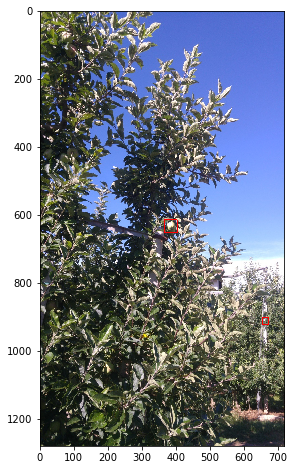

20170625_175829.jpg
[[416 912 448 960]
 [160 592 208 624]
 [128 528 176 576]
 [240 464 272 496]
 [560 560 592 592]]
<class 'numpy.ndarray'>


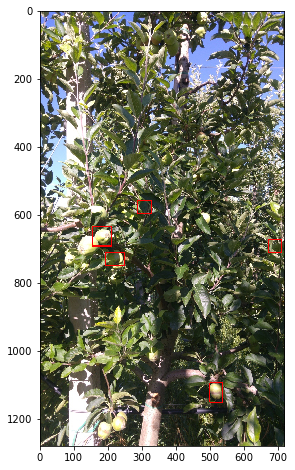

20170625_175836.jpg
[[240 880 272 912]
 [112 864 144 896]]
<class 'numpy.ndarray'>


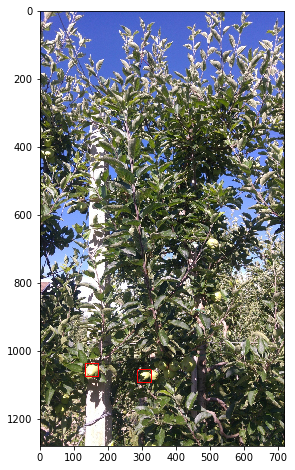

20170625_175842.jpg
[[ 208  832  240  864]
 [ 352 1008  368 1024]
 [  48  448   64  464]]
<class 'numpy.ndarray'>


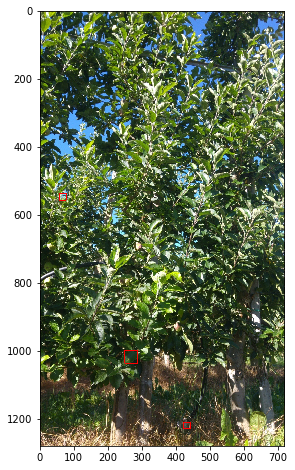

20170625_175850.jpg
[[  0 160  16 192]
 [208 320 224 336]
 [  0 896  32 928]
 [144 432 160 448]]
<class 'numpy.ndarray'>


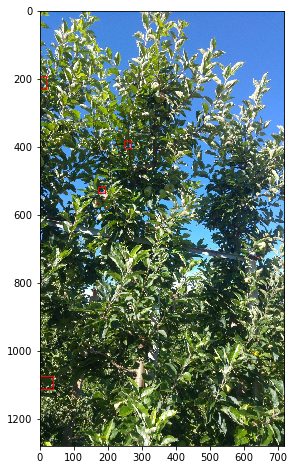

20170625_175854.jpg
[[480 144 512 176]]
<class 'numpy.ndarray'>


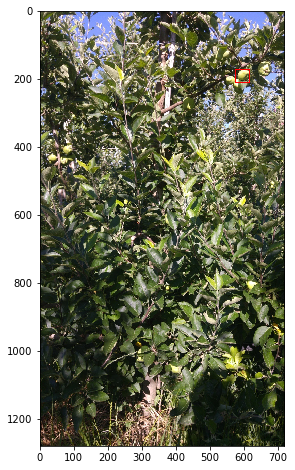

20170625_175858.jpg
[[464 256 496 288]
 [320 848 352 880]]
<class 'numpy.ndarray'>


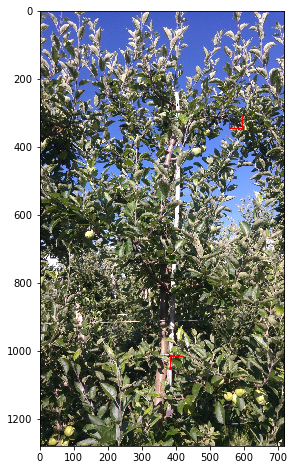

20170625_175909.jpg
[[ 16 560  48 592]
 [224 896 272 928]
 [384 896 416 928]
 [208 112 224 144]]
<class 'numpy.ndarray'>


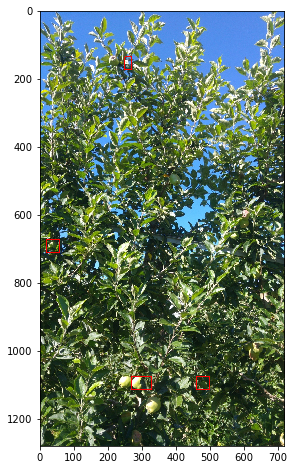

20170625_175918.jpg
[[224 128 256 160]
 [ 64 240  96 272]
 [272 272 288 304]
 [528 176 560 208]]
<class 'numpy.ndarray'>


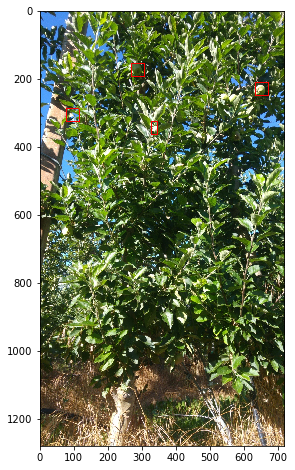

20170625_175924.jpg
[[560 560 576 576]
 [224 720 256 752]
 [336 128 352 144]
 [400 288 432 320]
 [544 560 560 576]
 [272 448 288 480]]
<class 'numpy.ndarray'>


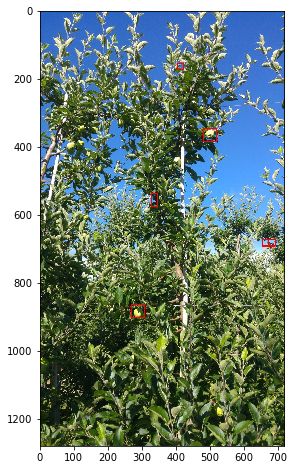

20170625_175925.jpg
[[224 832 256 864]
 [464 352 496 384]
 [400 112 432 144]
 [544 400 576 432]
 [384 496 416 528]]
<class 'numpy.ndarray'>


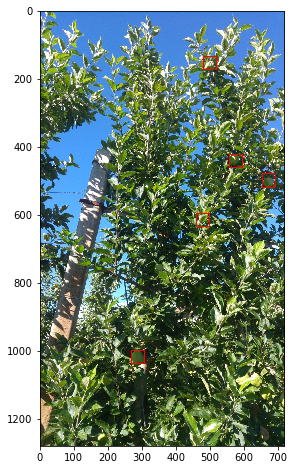

20170625_175937.jpg
[[ 208  432  256  464]
 [ 384  848  416  880]
 [ 256  656  288  688]
 [ 160  800  192  832]
 [ 144  992  176 1040]]
<class 'numpy.ndarray'>


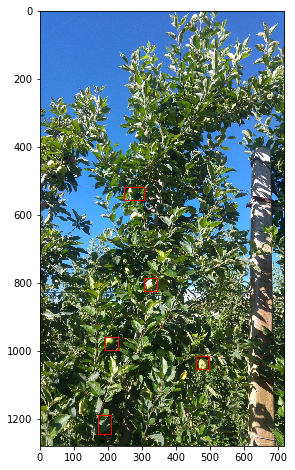

20170625_175948.jpg
[[ 16 704  48 752]
 [144 272 176 304]
 [512 208 544 240]]
<class 'numpy.ndarray'>


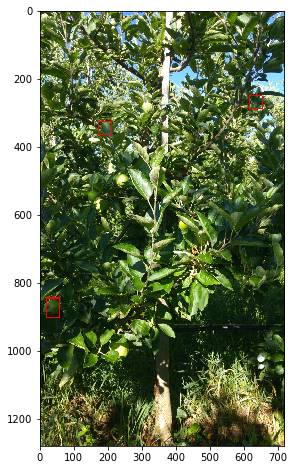

20170625_175949.jpg
[[528 320 560 352]
 [304 256 336 288]
 [256 720 288 752]
 [256 544 272 576]
 [432 880 464 928]]
<class 'numpy.ndarray'>


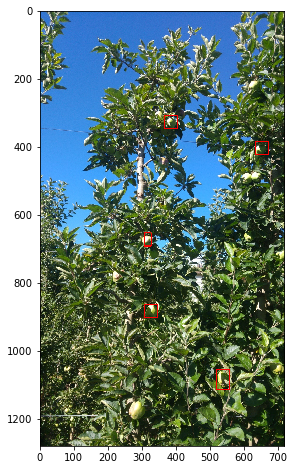

20170625_175957.jpg
<class 'numpy.ndarray'>


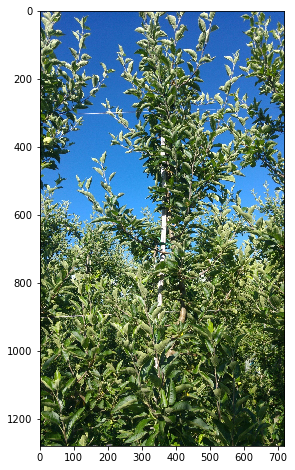

20170625_175959.jpg
[[464 480 496 512]
 [288 672 336 704]
 [192 320 224 352]
 [416  96 448 128]
 [544 624 576 656]]
<class 'numpy.ndarray'>


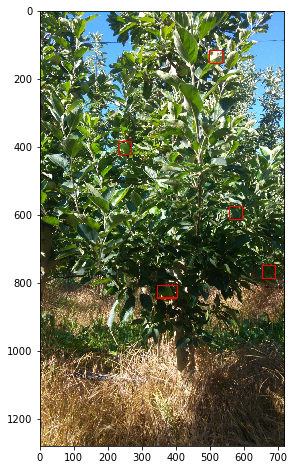

20170625_180003.jpg
[[288 384 304 400]
 [464 896 480 912]]
<class 'numpy.ndarray'>


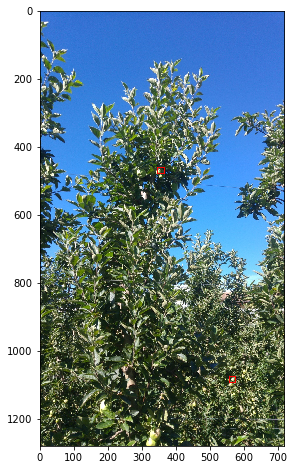

20170625_180009.jpg
[[416 624 448 656]
 [528 144 560 176]
 [384 656 416 688]
 [ 16   0  48  32]]
<class 'numpy.ndarray'>


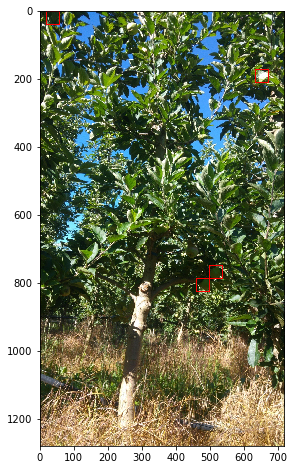

20170625_180016.jpg
[[  0  96  32 128]
 [528 320 544 352]
 [448 864 464 880]
 [304 816 336 832]
 [208 544 224 560]
 [304 624 320 640]]
<class 'numpy.ndarray'>


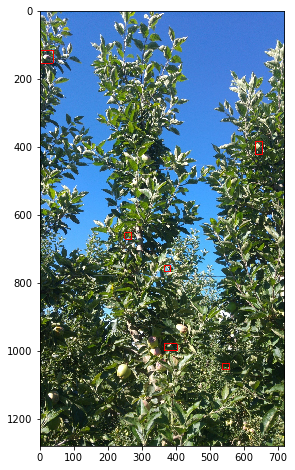

20170625_180027.jpg
[[ 32  32  48  48]
 [144 432 176 464]]
<class 'numpy.ndarray'>


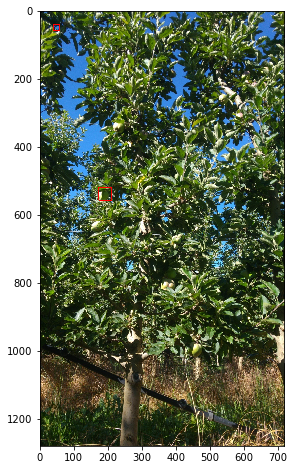

20170625_180047.jpg
[[160 336 176 352]
 [ 32 464  64 496]
 [144 272 160 288]
 [ 80 208  96 224]
 [  0 176  16 208]]
<class 'numpy.ndarray'>


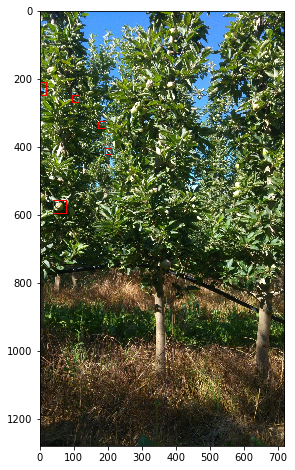

20170625_180050.jpg
[[288 768 320 800]
 [192 528 208 544]
 [512 576 544 608]
 [ 64 528  96 560]
 [272 432 304 464]
 [192 624 224 656]]
<class 'numpy.ndarray'>


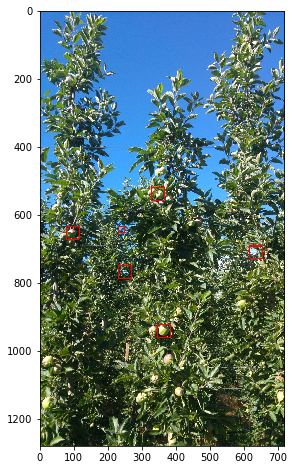

20170625_180105.jpg
[[304 688 320 704]
 [256 960 288 992]
 [544 864 576 896]
 [ 80 720  96 736]
 [544 928 576 960]
 [320 704 336 720]
 [ 64 720  80 736]
 [ 16 752  48 784]]
<class 'numpy.ndarray'>


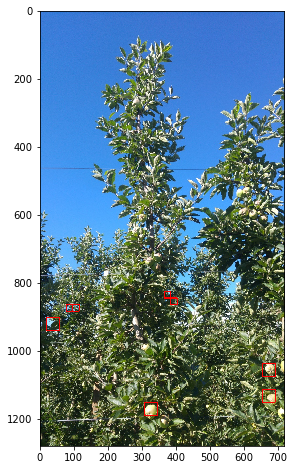

20170625_180110.jpg
[[ 512 1024  544 1072]
 [ 304  848  336  880]]
<class 'numpy.ndarray'>


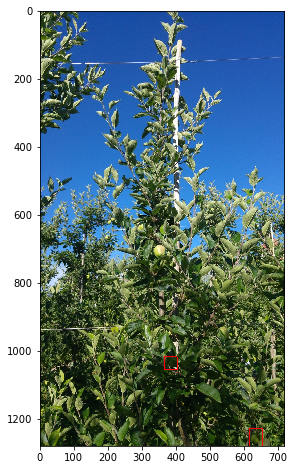

20170625_180115.jpg
[[560 256 592 288]
 [352 128 368 144]
 [576 608 592 640]
 [240  48 272  80]
 [336  32 352  48]
 [256 176 288 208]
 [192 288 224 304]
 [512 384 544 416]
 [560 352 592 384]
 [368 144 384 160]
 [ 48  64  64  80]]
<class 'numpy.ndarray'>


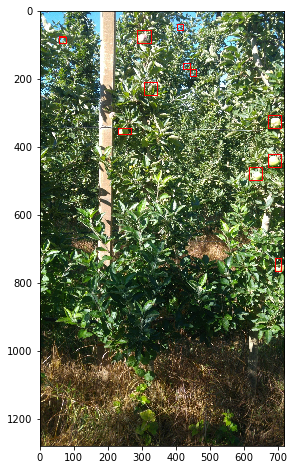

20170625_180117.jpg
[[272 480 288 512]
 [192 688 224 720]
 [352 960 384 992]
 [256 480 272 512]
 [528 784 560 816]
 [560 656 592 688]
 [240 496 256 512]]
<class 'numpy.ndarray'>


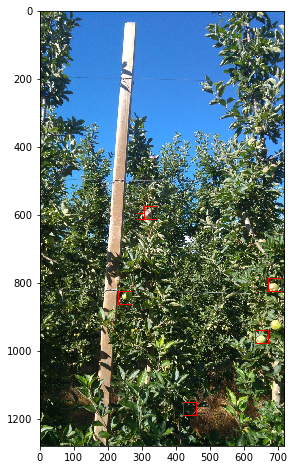

20170625_180128.jpg
[[224 160 256 192]
 [ 80 592  96 608]
 [352 768 368 784]
 [304 720 336 752]
 [240 320 272 352]
 [544 656 560 672]
 [400 544 416 560]]
<class 'numpy.ndarray'>


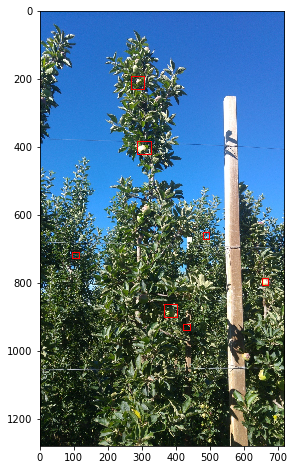

20170625_180137.jpg
[[448  64 464  80]
 [160 384 176 416]
 [368 208 384 224]
 [336 208 352 224]
 [112  80 128 112]
 [ 64 128  80 144]
 [ 64 160  80 176]
 [ 48 384  80 416]
 [304 368 336 384]
 [400 176 416 192]
 [368 192 384 224]
 [320 208 336 224]]
<class 'numpy.ndarray'>


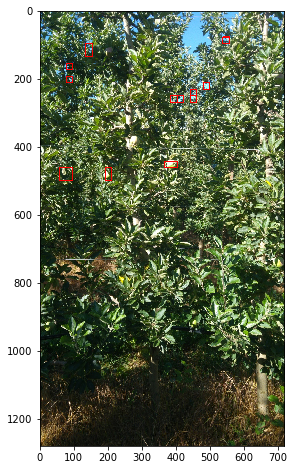

20170625_180141.jpg
[[528 800 544 816]
 [192 576 224 608]
 [ 80 816 112 832]
 [128 832 144 848]
 [416 768 432 784]
 [528 144 544 160]]
<class 'numpy.ndarray'>


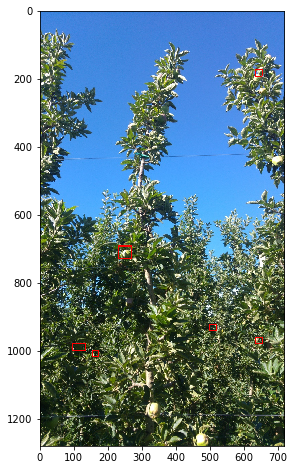

20170625_180156.jpg
[[432 800 464 832]
 [112 896 144 928]
 [368 928 416 976]
 [224 688 256 720]
 [496 560 512 576]
 [448 560 464 592]]
<class 'numpy.ndarray'>


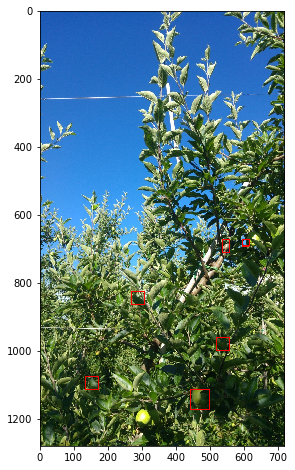

20170625_180201.jpg
[[368 688 384 704]
 [ 32 512  48 544]
 [144 720 160 736]
 [176 640 192 672]
 [272 576 288 608]
 [496 608 528 640]
 [192 736 208 752]
 [240 896 256 928]
 [ 32 608  48 624]
 [144 736 160 752]
 [208 400 240 416]]
<class 'numpy.ndarray'>


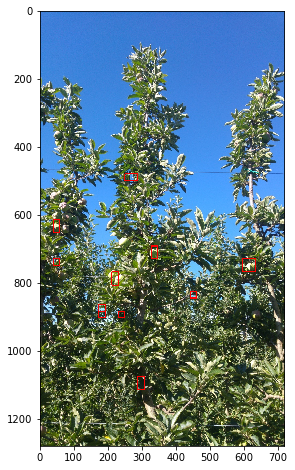

20170625_180209.jpg
[[432 464 464 496]
 [416 592 448 624]
 [320 528 352 560]
 [288 352 320 384]
 [352 480 384 512]
 [144 384 160 400]
 [176 720 208 752]]
<class 'numpy.ndarray'>


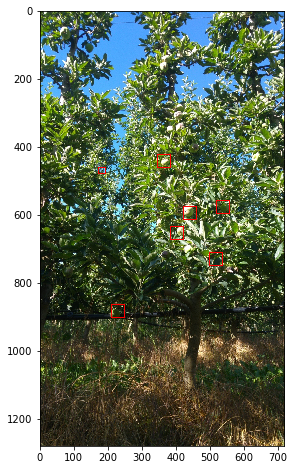

20170625_180214.jpg
[[368 544 384 560]
 [224 784 256 816]
 [128 640 144 656]
 [320 560 336 576]
 [400 528 432 560]
 [464 560 496 592]
 [256 912 288 944]]
<class 'numpy.ndarray'>


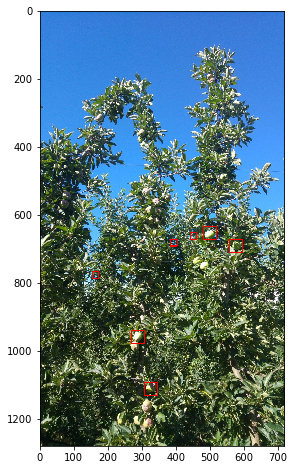

20170625_180239.jpg


KeyboardInterrupt: 

In [7]:
model_rpn.load_weights("model_frcnn_0.5.hdf5", by_name=True)
model_classifier.load_weights("model_frcnn_0.5.hdf5", by_name=True)
print("model_frcnn_0.5.hdf5")

model_rpn.compile(optimizer='sgd', loss='mse')
model_classifier.compile(optimizer='sgd', loss='mse')

all_imgs = []

classes = {}

bbox_threshold = 0.9

visualise = True

for idx, img_name in enumerate(sorted(os.listdir(img_path))):
	if not img_name.lower().endswith(('.bmp', '.jpeg', '.jpg', '.png', '.tif', '.tiff')):
		continue
	print(img_name)
	st = time.time()
	filepath = os.path.join(img_path,img_name)

# 	img = cv2.imread(filepath)
	img = imread(filepath)

	X, ratio = format_img(img, C)

	if K.image_dim_ordering() == 'tf':
		X = np.transpose(X, (0, 2, 3, 1))

	# get the feature maps and output from the RPN
	[Y1, Y2, F] = model_rpn.predict(X)
	

	R = roi_helpers.rpn_to_roi(Y1, Y2, C, K.image_dim_ordering(), overlap_thresh=0.7)

	# convert from (x1,y1,x2,y2) to (x,y,w,h)
	R[:, 2] -= R[:, 0]
	R[:, 3] -= R[:, 1]

	# apply the spatial pyramid pooling to the proposed regions
	bboxes = {}
	probs = {}

	for jk in range(R.shape[0]//C.num_rois + 1):
		ROIs = np.expand_dims(R[C.num_rois*jk:C.num_rois*(jk+1), :], axis=0)
		if ROIs.shape[1] == 0:
			break

		if jk == R.shape[0]//C.num_rois:
			#pad R
			curr_shape = ROIs.shape
			target_shape = (curr_shape[0],C.num_rois,curr_shape[2])
			ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
			ROIs_padded[:, :curr_shape[1], :] = ROIs
			ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
			ROIs = ROIs_padded

		[P_cls, P_regr] = model_classifier_only.predict([F, ROIs])

		for ii in range(P_cls.shape[1]):

			if np.max(P_cls[0, ii, :]) < bbox_threshold or np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
				continue

			cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

			if cls_name not in bboxes:
				bboxes[cls_name] = []
				probs[cls_name] = []

			(x, y, w, h) = ROIs[0, ii, :]

			cls_num = np.argmax(P_cls[0, ii, :])
			try:
				(tx, ty, tw, th) = P_regr[0, ii, 4*cls_num:4*(cls_num+1)]
				tx /= C.classifier_regr_std[0]
				ty /= C.classifier_regr_std[1]
				tw /= C.classifier_regr_std[2]
				th /= C.classifier_regr_std[3]
				x, y, w, h = roi_helpers.apply_regr(x, y, w, h, tx, ty, tw, th)
			except:
				pass
			bboxes[cls_name].append([C.rpn_stride*x, C.rpn_stride*y, C.rpn_stride*(x+w), C.rpn_stride*(y+h)])
			probs[cls_name].append(np.max(P_cls[0, ii, :]))

	all_dets = []

	for key in bboxes:
		bbox = np.array(bboxes[key])

		new_boxes, new_probs = roi_helpers.non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.5)
		for jk in range(new_boxes.shape[0]):
			(x1, y1, x2, y2) = new_boxes[jk,:]

			(real_x1, real_y1, real_x2, real_y2) = get_real_coordinates(ratio, x1, y1, x2, y2)

			cv2.rectangle(img,(real_x1, real_y1), (real_x2, real_y2), (int(class_to_color[key][0]), int(class_to_color[key][1]), int(class_to_color[key][2])),2)

			textLabel = '{}: {}'.format(key,int(100*new_probs[jk]))
			all_dets.append((key,100*new_probs[jk]))

			(retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_PLAIN,1,1)
			textOrg = (real_x1, real_y1-0)

# 			cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 2)
# 			cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
# 			cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_PLAIN, 3, (0, 0, 0), 1)

		print(new_boxes)
# 	cv2.imshow('img', img)
#	cv2.imwrite('./results_imgs/{}.png'.format(idx),img)
	print(type(img))
	plt.figure(figsize=(20, 8))
# 	plt.subplot(1,2,1)
	plt.imshow(img)
# 	plt.subplot(1,2,2)
# 	plt.imshow(imread(filepath))
	plt.show()